In [1]:
# code
# !pip install timm shap lime opencv-python

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, datasets
from PIL import Image
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import train_test_split

# timm: PyTorch Image Models
import timm

# For Grad-CAM
import cv2
import torch.nn.functional as F

# SHAP
import shap

# LIME
from lime import lime_image
from skimage.segmentation import mark_boundaries


In [2]:
# Load the trained model instead of retraining
DEVICE        = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", DEVICE)
model            = timm.create_model('efficientnet_b0', pretrained=False)
num_features     = model.classifier.in_features
model.classifier = nn.Linear(num_features, 2)

model.load_state_dict(torch.load('efficientnet_b0_real_vs_fake.pth', map_location=DEVICE))
model = model.to(DEVICE)
model.eval()

print("Model loaded and ready for inference!")

Using device: cuda
Model loaded and ready for inference!


In [3]:
val_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], 
                         [0.229, 0.224, 0.225])
])

In [202]:
def grad_cam(model, image_tensor, target_layer, class_idx=None, device='cuda'):
    """
    model        : trained model
    image_tensor : single image tensor of shape (1, C, H, W)
    target_layer : the specific layer to compute Grad-CAM for (e.g., model.blocks[5][-1].conv_pw)
    class_idx    : which class to visualize Grad-CAM for. If None, uses predicted class.
    device       : device to run the model on (default: 'cuda')
    """
    model.eval()

    # Hook to capture features and gradients
    conv_output = []
    grad_output = []

    def forward_hook(module, inp, out):
        conv_output.append(out)

    def backward_hook(module, grad_in, grad_out):
        grad_output.append(grad_out[0])

    # Register hooks to the specified target layer
    forward_handle = target_layer.register_forward_hook(forward_hook)
    backward_handle = target_layer.register_backward_hook(backward_hook)

    # Forward pass
    output = model(image_tensor.to(device))
    if class_idx is None:
        class_idx = torch.argmax(output, dim=1).item()

    # Zero grads
    model.zero_grad()
    # Backward pass on the chosen class
    loss = output[0, class_idx]
    loss.backward()

    # Get features and gradients
    activations = conv_output[0].detach().cpu().numpy()[0, :]
    gradients = grad_output[0].detach().cpu().numpy()[0, :]

    # Global average pool the gradients
    weights = np.mean(gradients, axis=(1, 2))

    # Compute weighted combination of activations
    cam = np.zeros(activations.shape[1:], dtype=np.float32)
    for i, w in enumerate(weights):
        cam += w * activations[i, :, :]

    # ReLU
    cam = np.maximum(cam, 0)
    # Normalize
    cam -= np.min(cam)
    cam /= np.max(cam) if np.max(cam) != 0 else 1

    # Remove hooks
    forward_handle.remove()
    backward_handle.remove()

    return cam, class_idx

def show_grad_cam_on_image(img_pil, cam):
    """
    Overlays the Grad-CAM heatmap on the original image
    """
    img     = np.array(img_pil)
    h, w, _ = img.shape
    cam = cv2.resize(cam, (w, h))
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    overlay_img = heatmap + np.float32(img) / 255
    overlay_img = overlay_img / np.max(overlay_img)
    return np.uint8(255 * overlay_img)

def get_all_conv_layers(model):
    """
    Retrieves all convolutional layers from the model
    """
    conv_layers = []
    def recursive_search(module, prefix=''):
        for name, child in module.named_children():
            if isinstance(child, torch.nn.Conv2d):
                conv_layers.append((f"{prefix}{name}", child))
            recursive_search(child, f"{prefix}{name}.")
    recursive_search(model)
    return conv_layers

def generate_gradcam_for_all_layers(model, image_path, val_transforms, device='cuda'):
    """
    Generates and visualizes Grad-CAM for all convolutional layers
    """
    # Load and preprocess image
    example_img_pil = Image.open(image_path).convert('RGB')
    example_img_tensor = val_transforms(example_img_pil).unsqueeze(0).to(device)

    # Get all convolutional layers
    conv_layers = get_all_conv_layers(model)
    
    # Get predicted class
    _, predicted_class = grad_cam(model, example_img_tensor, conv_layers[0][1], class_idx=None, device=device)
    
    # Calculate grid size
    n_layers = len(conv_layers)
    cols = 4
    rows = (n_layers + cols - 1) // cols
    
    # Create figure
    plt.figure(figsize=(cols * 5, rows * 5))
    
    # Original image
    plt.subplot(rows + 1, cols, 1)
    plt.title("Original")
    plt.imshow(example_img_pil)
    plt.axis('off')
    
    # Generate Grad-CAM for each layer
    for idx, (layer_name, layer) in enumerate(conv_layers):
        try:
            cam, _ = grad_cam(model, example_img_tensor, layer, class_idx=predicted_class, device=device)
            grad_cam_result = show_grad_cam_on_image(example_img_pil, cam)
            
            # Plot
            plt.subplot(rows + 1, cols, idx + 2)
            plt.title(f"Layer: {layer_name}")
            plt.imshow(grad_cam_result)
            plt.axis('off')
        except Exception as e:
            print(f"Error processing layer {layer_name}: {str(e)}")
            continue
    
    plt.tight_layout()
    plt.show()
    
    
    return predicted_class

def save_gradcam_outputs(cam, overlay_img, filename_prefix, output_dir="gradcam_outputs"):
    """
    Saves the Grad-CAM mask and overlay image using a custom filename prefix.

    Args:
        cam (np.ndarray): The Grad-CAM heatmap.
        overlay_img (np.ndarray): The overlay image.
        filename_prefix (str): Custom prefix for the output filenames (e.g., 'my_gradcam').
        output_dir (str): Directory to save the files (default: 'gradcam_outputs').
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Sanitize filename_prefix for file system (replace invalid characters)
    safe_filename = filename_prefix.replace('/', '_').replace('\\', '_').replace(':', '_')
    
    # Save Grad-CAM mask
    mask_path = os.path.join(output_dir, f"{safe_filename}_mask.png")
    cv2.imwrite(mask_path, np.uint8(255 * cam))
    
    # Save overlay image
    overlay_path = os.path.join(output_dir, f"{safe_filename}_overlay.png")
    cv2.imwrite(overlay_path, overlay_img)

    return mask_path, overlay_path

In [203]:
def generate_gradcam_for_specific_layer(model, image_path, val_transforms, target_layer, device='cuda'):
    """
    Generates and visualizes Grad-CAM for a specific convolutional layer, returning both the overlayed image and the heatmap.
    
    Args:
        model: Trained PyTorch model
        image_path: Path to the input image
        val_transforms: Preprocessing transforms for the image
        target_layer: Specific layer to compute Grad-CAM for
        device: Device to run the model on (default: 'cuda')
    
    Returns:
        tuple: (overlayed_image, heatmap, predicted_class)
            - overlayed_image: Original image with Grad-CAM overlay (numpy array, uint8)
            - heatmap: Grad-CAM heatmap (numpy array, float32)
            - predicted_class: Predicted class index
    """
    model.eval()

    # Load and preprocess image
    img_pil = Image.open(image_path).convert('RGB')
    img_tensor = val_transforms(img_pil).unsqueeze(0).to(device)

    # Hook to capture features and gradients
    conv_output = []
    grad_output = []

    def forward_hook(module, inp, out):
        conv_output.append(out)

    def backward_hook(module, grad_in, grad_out):
        grad_output.append(grad_out[0])

    # Register hooks
    forward_handle = target_layer.register_forward_hook(forward_hook)
    backward_handle = target_layer.register_backward_hook(backward_hook)

    # Forward pass
    output = model(img_tensor)
    class_idx = torch.argmax(output, dim=1).item()

    # Backward pass
    model.zero_grad()
    loss = output[0, class_idx]
    loss.backward()

    # Get features and gradients
    activations = conv_output[0].detach().cpu().numpy()[0, :]
    gradients = grad_output[0].detach().cpu().numpy()[0, :]

    # Global average pool the gradients
    weights = np.mean(gradients, axis=(1, 2))

    # Compute weighted combination
    cam = np.zeros(activations.shape[1:], dtype=np.float32)
    for i, w in enumerate(weights):
        cam += w * activations[i, :, :]

    # ReLU and normalize
    cam = np.maximum(cam, 0)
    cam -= np.min(cam)
    cam /= np.max(cam) if np.max(cam) != 0 else 1

    # Remove hooks
    forward_handle.remove()
    backward_handle.remove()

    # Create overlay
    img = np.array(img_pil)
    h, w, _ = img.shape
    heatmap = cv2.resize(cam, (w, h))
    colored_heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    colored_heatmap = np.float32(colored_heatmap) / 255
    overlay_img = colored_heatmap + np.float32(img) / 255
    overlay_img = overlay_img / np.max(overlay_img)
    overlay_img = np.uint8(255 * overlay_img)

    return overlay_img, heatmap, class_idx

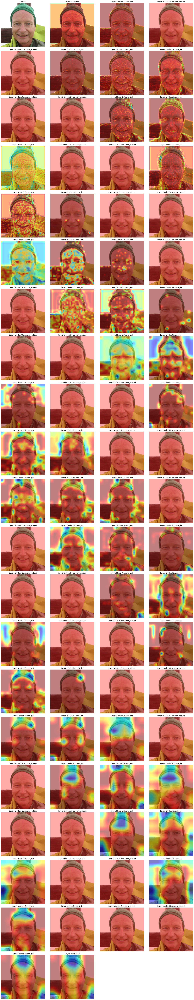

Prediction: 1


In [249]:
folder_name = f"dd/real_upload/"
image_name=f"real_image_32"
ext = f".png"
image_path = f"{folder_name}{image_name}{ext}"
# Assuming model and val_transforms are defined
predicted_class = generate_gradcam_for_all_layers(model, image_path, val_transforms, device=DEVICE)
print("Prediction:", predicted_class)

In [250]:
target_layer = model.blocks[3][0].conv_pwl
overlay_img, heatmap, class_idx = generate_gradcam_for_specific_layer(model, 
                                                                      image_path,
                                                                      val_transforms, 
                                                                      target_layer, 
                                                                      device=DEVICE)

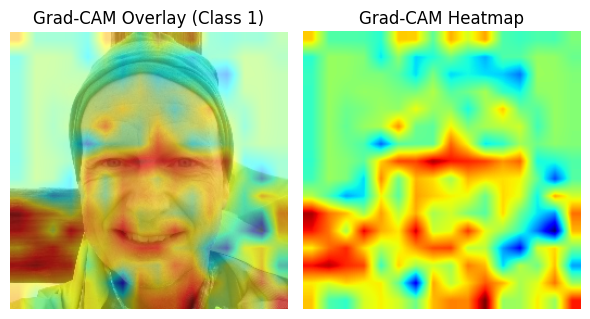

Predicted Class: 1


In [251]:
plt.figure(figsize=(6, 5))

# Original image with Grad-CAM overlay
plt.subplot(1, 2, 1)
plt.title(f"Grad-CAM Overlay (Class {predicted_class})")
plt.imshow(overlay_img)
plt.axis('off')

# Heatmap only
plt.subplot(1, 2, 2)
plt.title("Grad-CAM Heatmap")
# plt.imshow(heatmap, cmap='jet_r', vmin=0, vmax=1)
plt.imshow(heatmap, cmap='jet_r')
plt.axis('off')

plt.tight_layout()
plt.show()

print(f"Predicted Class: {predicted_class}")

In [252]:
overlay_path = os.path.join(folder_name, f"{image_name}_exp{ext}")
cv2.imwrite(overlay_path, cv2.cvtColor(overlay_img, cv2.COLOR_RGB2BGR))

True

In [253]:
heatmap_path = os.path.join(folder_name, f"{image_name}_map{ext}")
plt.imsave(heatmap_path, heatmap, cmap='jet_r')